## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
#%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)

#cv2.destroyAllWindows()
dist_pickle={}
dist_pickle['image_shape'] = cv2.imread(images[0]).shape
dist_pickle['objpoints'] = objpoints
dist_pickle['imgpoints'] = imgpoints

with open('dist_pickle.p', 'wb') as f:
    pickle.dump(dist_pickle, f)

## Correcting for Distortion using Chessboard Images

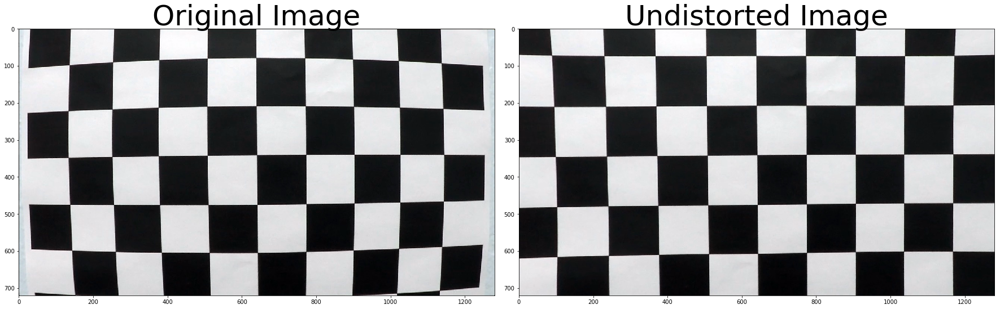

In [2]:
import re
%matplotlib inline

dist_pickle = pickle.load(open('dist_pickle.p', 'rb'))
objpoints = dist_pickle['objpoints']
imgpoints = dist_pickle['imgpoints']
image_shape = dist_pickle['image_shape']

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_shape[:2], None, None)

output_image_folder = '../output_images/undistorted_'

for fname in images:
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    img_save_path = output_image_folder + re.split('/', fname)[-1]
    cv2.imwrite(img_save_path, undistorted)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.imread(images[0]))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(cv2.imread(output_image_folder + re.split('/', images[0])[-1]))
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Pipeline 
## test images distortion correction

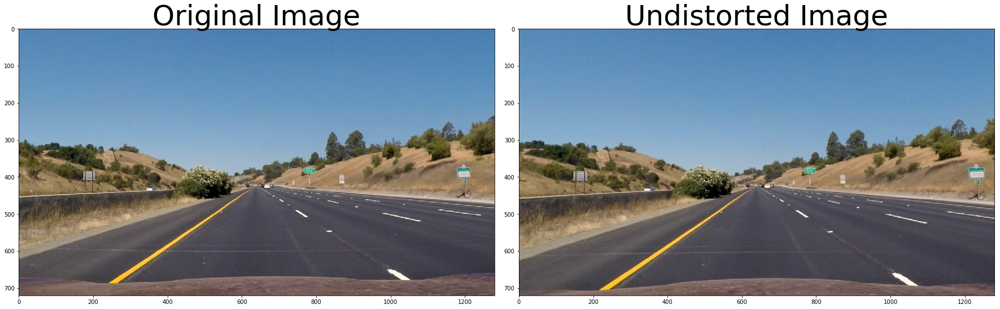

In [3]:
import re
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


dist_pickle = pickle.load(open('dist_pickle.p', 'rb'))
objpoints = dist_pickle['objpoints']
imgpoints = dist_pickle['imgpoints']
image_shape = dist_pickle['image_shape']

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_shape[:2], None, None)


output_image_folder = '../output_images/undistorted_'
test_images = glob.glob('../test_images/*.jpg')

for fname in test_images:
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    #img_save_path = output_image_folder + re.split('/', fname)[-1]
    #cv2.imwrite(img_save_path, undistorted)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
original_img = cv2.imread(test_images[0])
b,g,r = cv2.split(original_img)
rgb_original_img = cv2.merge([r,g,b])
ax1.imshow(rgb_original_img)
ax1.set_title('Original Image', fontsize=50)

undistorted_img = cv2.imread(output_image_folder + re.split('/', test_images[0])[-1])
b,g,r = cv2.split(undistorted_img)
rgb_undistorted_img = cv2.merge([r,g,b])
ax2.imshow(rgb_undistorted_img)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Use color transforms, gradients, etc., to create a thresholded binary image.

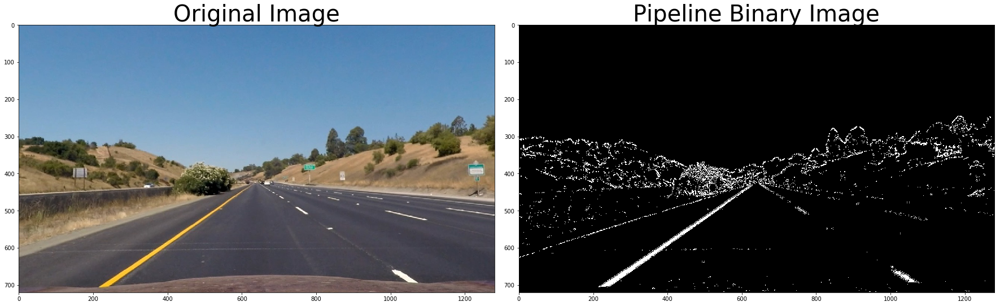

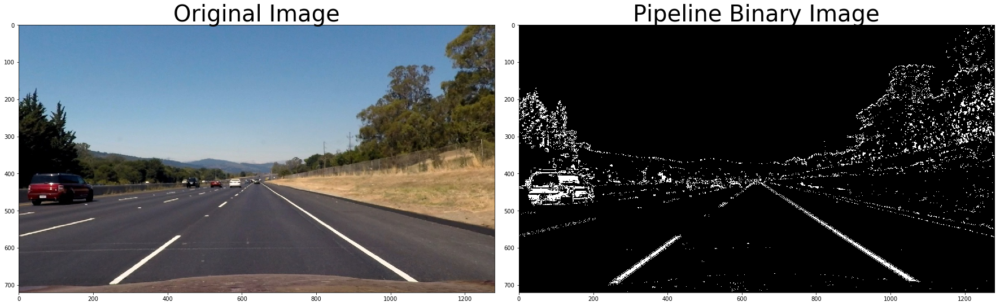

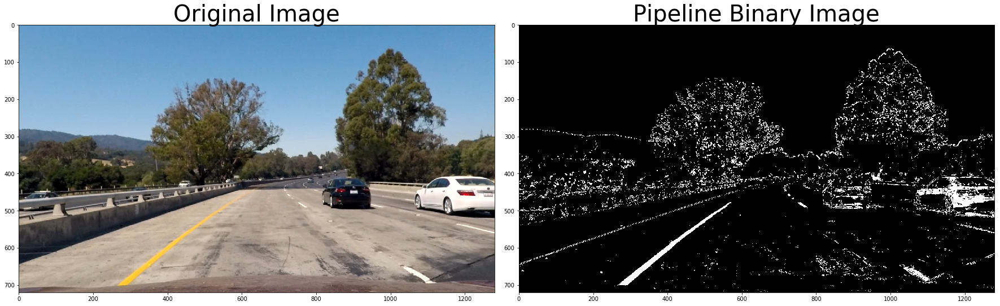

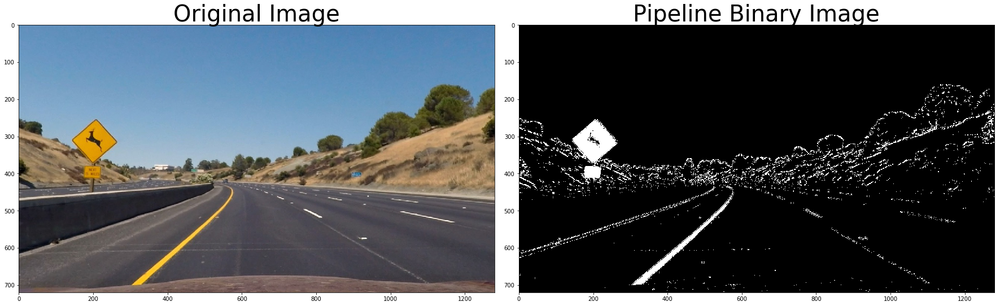

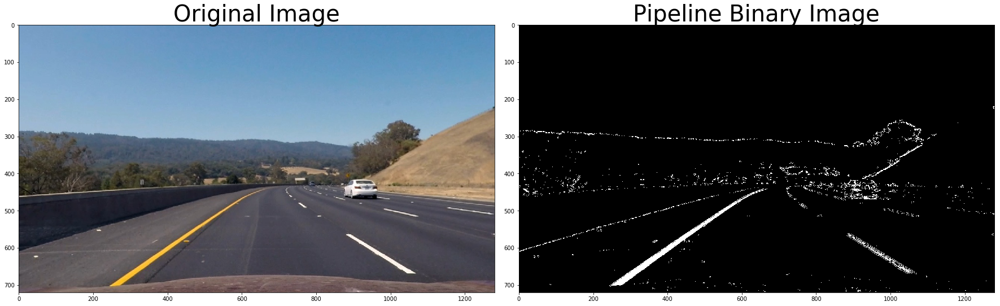

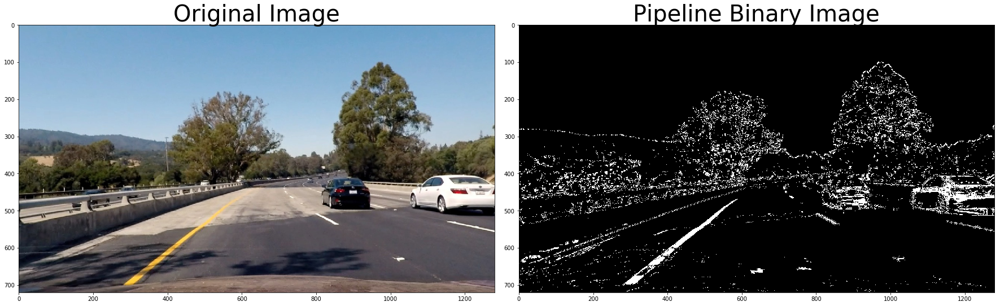

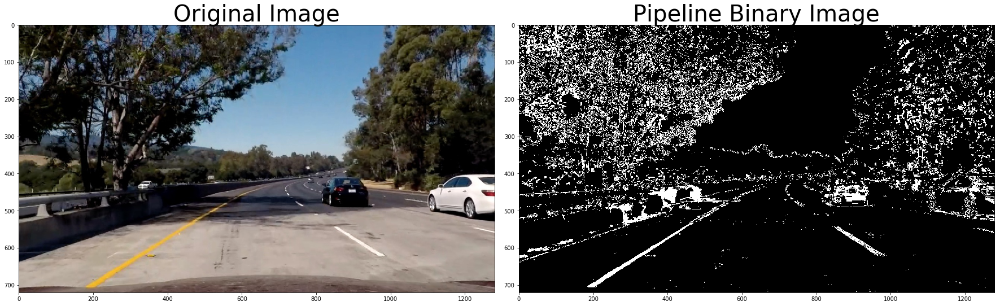

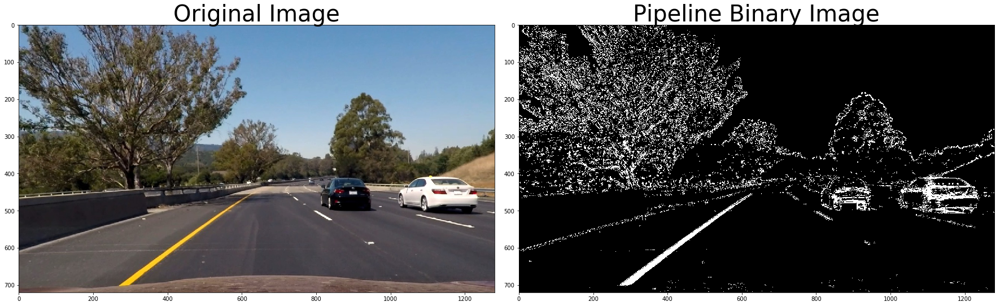

In [44]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, abs_thresh=(0, 255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= abs_thresh[0]) & (scaled_sobel <= abs_thresh[1])] = 1

    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobel = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    return binary_output

def dir_threshold(img, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    graddir = np.arctan2(abs_sobely, abs_sobelx)
    
    binary_output = np.zeros_like(graddir)
    binary_output[(graddir >= dir_thresh[0]) & (graddir<=dir_thresh[1])] = 1
    
    return binary_output

def s_channel_threshold(img, s_thresh=(170, 255)):
    img = np.copy(img)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    s_channel = hls[:,:,2]
    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    return s_binary

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    
    return masked_image


def pipeline(image):

    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, abs_thresh=(20, 100))
    grady_binary = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, abs_thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=3, dir_thresh=(0.7, 1.3))
    s_channel_binary = s_channel_threshold(image, s_thresh=(170, 255))

    combine_image = np.zeros_like(dir_binary)
    

    combine_image[((gradx_binary == 1) & (grady_binary == 1)) \
                 | ((mag_binary == 1) & (dir_binary == 1)) \
                 | (s_channel_binary ==1)] = 1
    
    
#    vertices = np.array([[(575,464),
##                      (720,464), 
#                      (1150,682), 
#                      (258,682)]], dtype=np.int32)

    
    img_size = (image.shape[1], image.shape[0])
    
    xoffset = 71
    yoffset = 101
    vertices = np.array([[img_size[0]/2-xoffset, img_size[1]/2+yoffset],
                      [img_size[0]/2+xoffset, img_size[1]/2+yoffset],
                      [img_size[0]-200, img_size[1]-49],
                      [199, img_size[1]-49]], dtype=np.int32)
    
#åvertices = np.array([[(x_offset,image.shape[0]),
#                      (image.shape[1]/2-x_mid_offset, y_offset), 
#                      (image.shape[1]/2+x_mid_offset, y_offset), 
#                      (image.shape[1]-x_offset,image.shape[0])]], dtype=np.int32)
#    binary_image = region_of_interest(combine_image, vertices)
    
    return combine_image
    
    

output_image_folder = '../output_images/binary_images_'
test_images = glob.glob('../output_images/undistorted_[st]*.jpg')

for fname in test_images:
    image = mpimg.imread(fname)
   
    pipeline_image = pipeline(image)
    img_save_path = output_image_folder + re.split('/', fname)[-1]
    mpimg.imsave(img_save_path, pipeline_image, cmap='gray')

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(pipeline_image, cmap='gray')
    ax2.set_title('Pipeline Binary Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    
#image = mpimg.imread('../output_images/undistorted_straight_lines1.jpg')


## Perspective transform

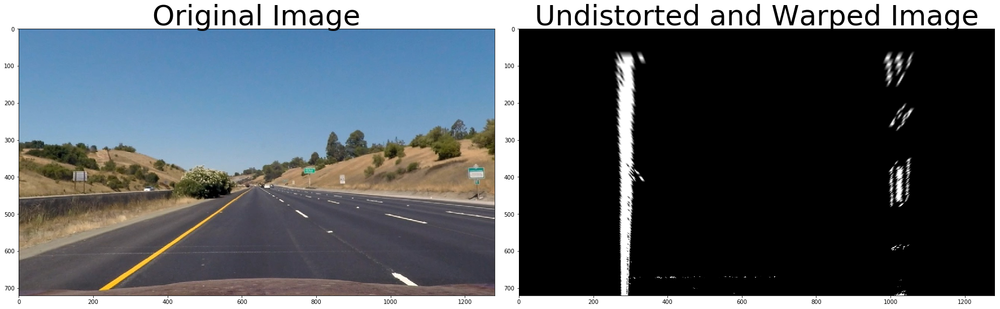

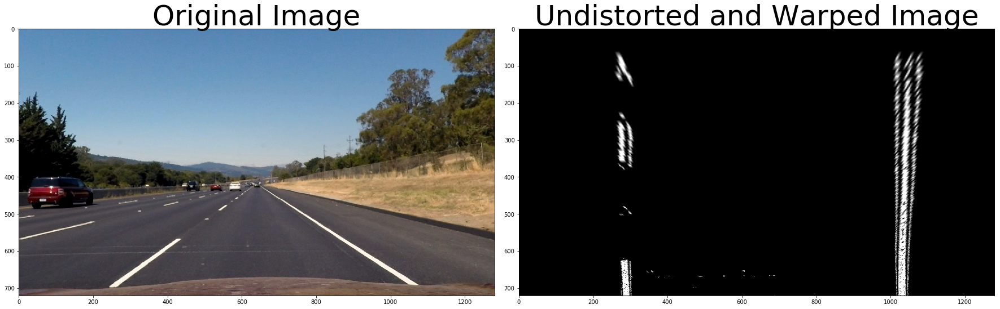

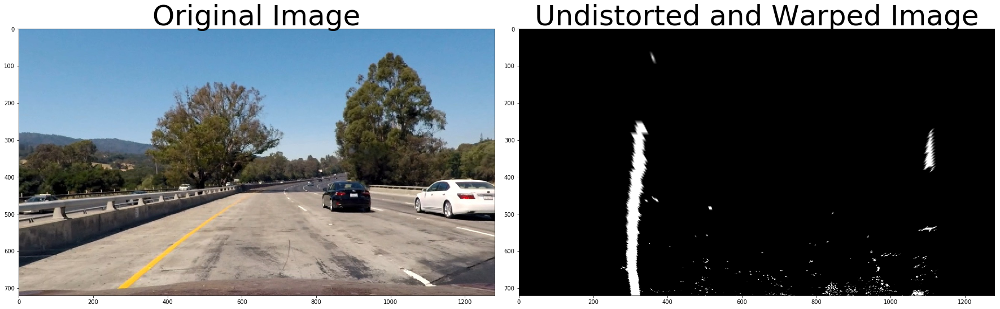

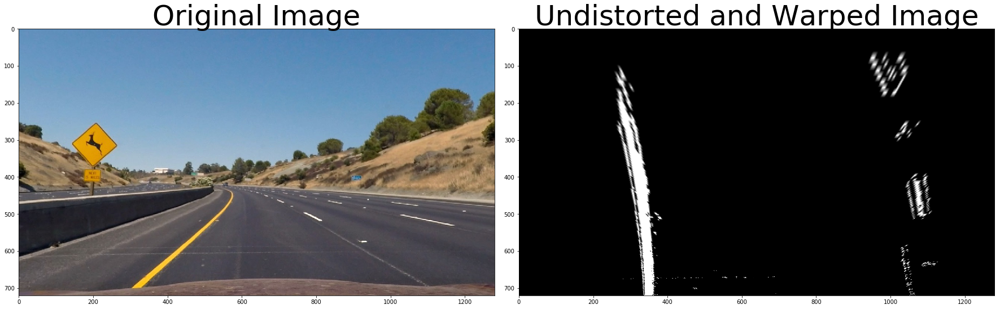

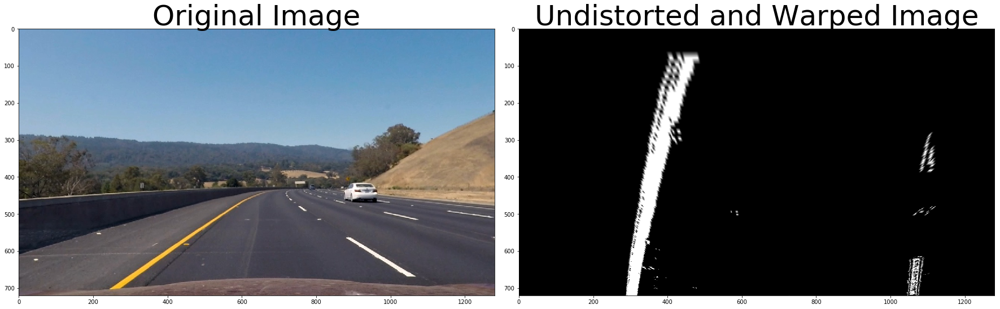

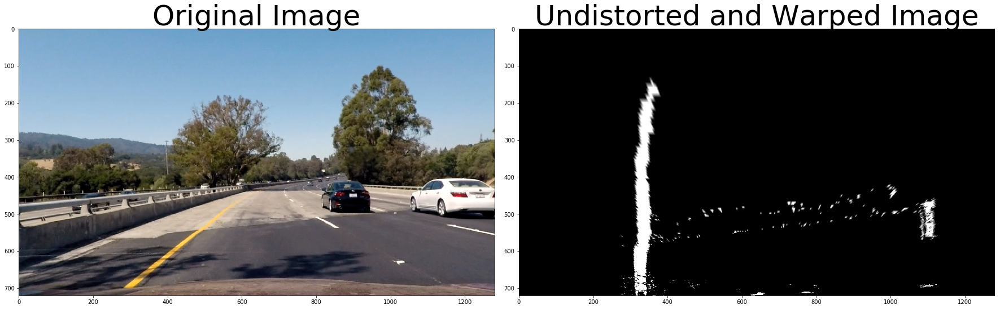

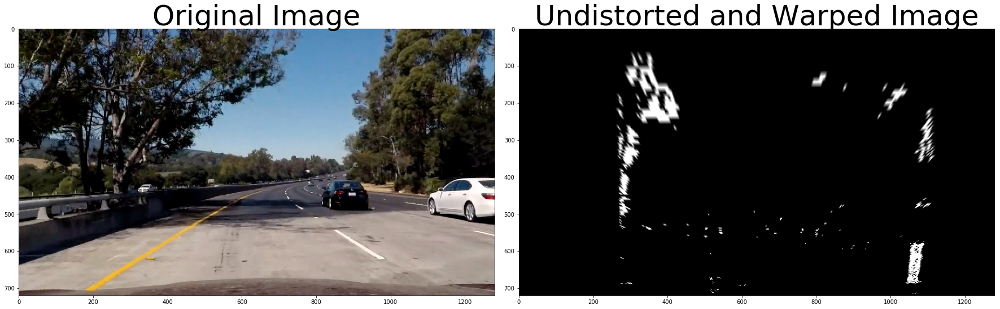

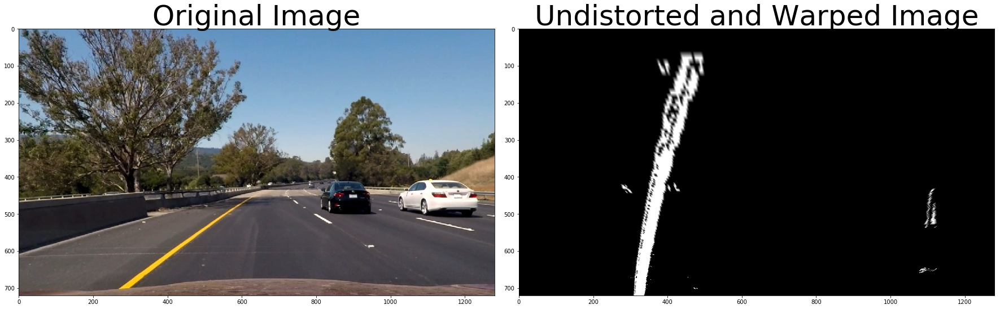

In [36]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, mtx, dist):
    
    img_size = (img.shape[1], img.shape[0])
    
    #src = np.float32([[602, 460],
    #                  [728, 460],
    #                  [1090, 670],
    #                  [292, 670]])
    
    #src = np.float32([(575,464),
    #              (707,464), 
    #              (1049,682), 
    #              (258,682)])
    
    xoffset = 70
    yoffset = 100
    src = np.float32([[img_size[0]/2-xoffset, img_size[1]/2+yoffset],
                      [img_size[0]/2+xoffset, img_size[1]/2+yoffset],
                      [img_size[0]-200, img_size[1]-50],
                      [200, img_size[1]-50]])

    offset = 200
    dst = np.float32([[offset, 0], 
                      [img_size[0]-offset, 0],
                      [img_size[0]-offset, img_size[1]],
                      [offset, img_size[1]]])

    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    

    # Return the resulting image and matrix
    return warped, M, Minv


output_image_folder = '../output_images/perspective_'
test_images = glob.glob('../output_images/undistorted_[st]*.jpg')

for fname in test_images:
    image = mpimg.imread(fname)
   
    pipeline_image = pipeline(image)
    binary_warped, binary_warped_M, binary_warped_Minv = corners_unwarp(pipeline_image, mtx, dist)

    img_save_path = output_image_folder + re.split('/', fname)[-1]
    mpimg.imsave(img_save_path, binary_warped, cmap='gray')

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image, cmap='gray')
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(binary_warped, cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



## Lane finding and fit their positions with a polynomial

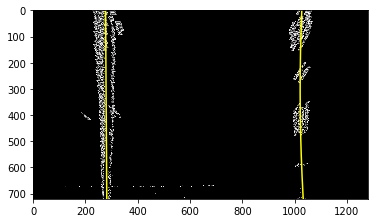

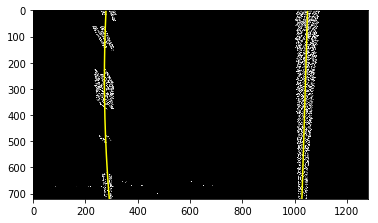

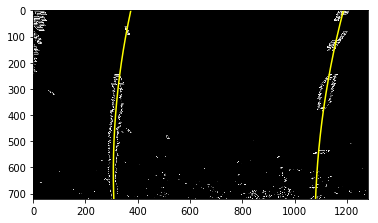

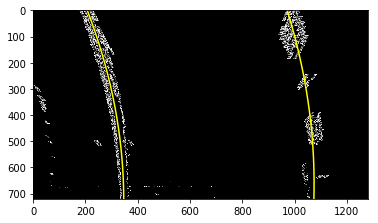

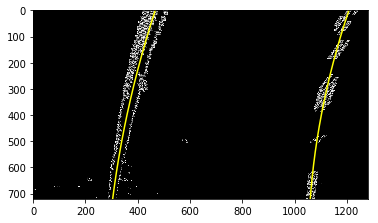

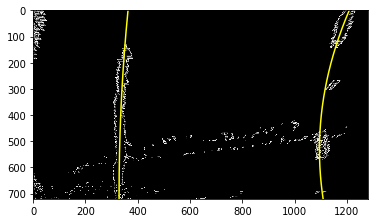

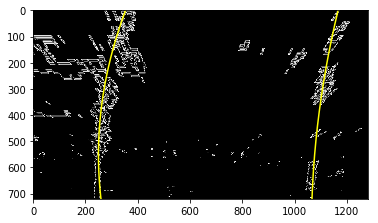

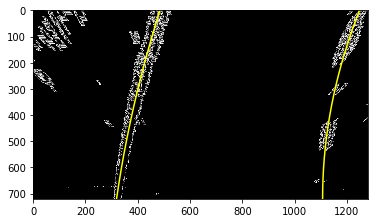

In [45]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

        
def lane_fitting_first_frame(binary_warped):

    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)

    # Create an output image to draw on and  visualize the result
    #out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    return left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, ploty, left_fitx, right_fitx

def lane_fitting_nonfirst_frame(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, ploty, left_fitx, right_fitx


def lane_fitting(img, left_fit, right_fit):
    
    if left_fit==None and right_fit==None:
        left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds = lane_fitting_first_frame(img)
    else:
        left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds = lane_fitting_nonfirst_frame(img,left_fit, right_fit)
        
    return left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds
        


import matplotlib.pyplot as plt

output_image_folder = '../output_images/curve_fitting_'
test_images = glob.glob('../output_images/undistorted_[st]*.jpg')

for fname in test_images:
    image = mpimg.imread(fname)
   
    pipeline_image = pipeline(image)
    binary_warped, binary_warped_M, binary_warped_Minv = corners_unwarp(pipeline_image, mtx, dist)
    left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, ploty, left_fitx, right_fitx = lane_fitting_first_frame(binary_warped)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255


    # Generate x and y values for plotting
    #ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
   # left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    #right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    img_save_path = output_image_folder + re.split('/', fname)[-1]
    
    #out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    #out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    fig = plt.figure()
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    fig.savefig(img_save_path)



## Curvature and center calculation

In [9]:
def curve_center_cal(binary_warped, left_fit, right_fit):
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    car_position = binary_warped.shape[1]/2
    avg = (left_fitx + right_fitx)/2
    lane_center_position = np.mean(avg[360:])
    center_dist = (car_position - lane_center_position) * xm_per_pix
    #print(center_dist, 'm')
    
    return left_curverad, right_curverad, center_dist

left_curverad, right_curverad, center_dist = curve_center_cal(binary_warped, left_fit, right_fit)

## Result plotted back down on to the road

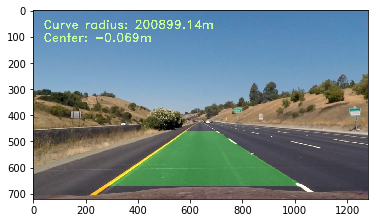

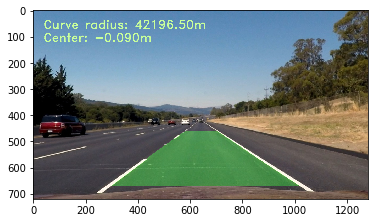

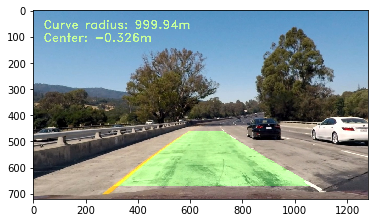

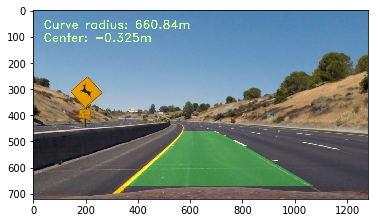

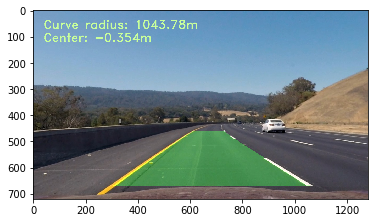

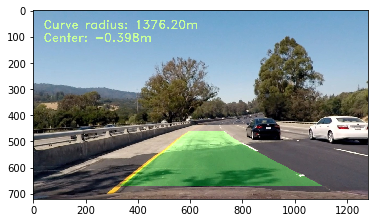

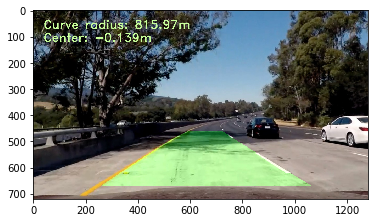

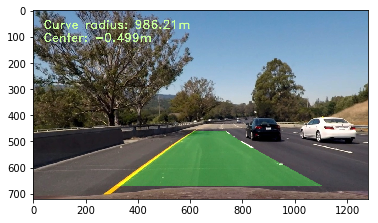

In [14]:
from numpy.linalg import inv

def line_images(undist, warped, Minv, ploty, left_fitx, right_fitx,left_curverad, right_curverad, center_dist):

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    
    font = cv2.FONT_HERSHEY_DUPLEX

    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    text = 'Curve radius: ' + '{:04.2f}'.format((left_curverad+right_curverad)/2) + 'm'
    cv2.putText(result, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    
    text = 'Center: ' + '{:04.3f}'.format(center_dist) + 'm '
    cv2.putText(result, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    #plt.imshow(result)
    
    return result


output_image_folder = '../output_images/back_on_road_'
test_images = glob.glob('../output_images/undistorted_[st]*.jpg')

for fname in test_images:
    image = mpimg.imread(fname)
   
    pipeline_image = pipeline(image)
    binary_warped, binary_warped_M, binary_warped_Minv = corners_unwarp(pipeline_image, mtx, dist)
    left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, ploty, left_fitx, right_fitx = lane_fitting_first_frame(binary_warped)
 
    left_curverad, right_curverad, center_dist = curve_center_cal(binary_warped, left_fit, right_fit)
    
    line_image_result = line_images(image, binary_warped, binary_warped_Minv, ploty, left_fitx, right_fitx,left_curverad, right_curverad, center_dist)
    
    
    img_save_path = output_image_folder + re.split('/', fname)[-1]
    mpimg.imsave(img_save_path, line_image_result)
    
    plt.figure()
    plt.imshow(line_image_result)

In [15]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        self.first_frame = True
        self.left_fit = []
        self.right_fit = []

In [32]:
def process_image(image):
    
    # camera calibrate and distortion correction
    dist_pickle = pickle.load(open('dist_pickle.p', 'rb'))
    objpoints = dist_pickle['objpoints']
    imgpoints = dist_pickle['imgpoints']
    image_shape = dist_pickle['image_shape']

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_shape[:2], None, None)
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)

    
    # binary thresholded images
    pipeline_image = pipeline(undistorted)
    
    
    # perspective transform
    binary_warped, binary_warped_M, binary_warped_Minv = corners_unwarp(pipeline_image, mtx, dist)
    
    # lane fitting
    if frame_flag.first_frame==True:
        left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, ploty, left_fitx, right_fitx = lane_fitting_first_frame(binary_warped)
        frame_flag.first_frame = False
        frame_flag.left_fit.append(left_fit)
        frame_flag.right_fit.append(right_fit)
    else:
        left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, ploty, left_fitx, right_fitx = lane_fitting_nonfirst_frame(binary_warped, frame_flag.left_fit[-1], frame_flag.right_fit[-1])
        frame_flag.left_fit.append(left_fit)
        frame_flag.right_fit.append(right_fit)
        
    #left_fit, right_fit, nonzerox, nonzeroy, left_lane_inds, right_lane_inds = lane_fitting(binary_warped, left_fit, right_fit)

    # curve and center calculation
    left_curverad, right_curverad, center_dist = curve_center_cal(binary_warped, left_fit, right_fit)
    
    # line image
    line_image = line_images(undistorted, binary_warped, binary_warped_Minv, ploty, left_fitx, right_fitx,left_curverad, right_curverad, center_dist)

    return line_image


In [19]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

frame_flag = Line()

white_output = '../project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video ../project_video_output.mp4
[MoviePy] Writing video ../project_video_output.mp4


100%|█████████▉| 1260/1261 [31:19<00:01,  1.50s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../project_video_output.mp4 

CPU times: user 31min 45s, sys: 1min, total: 32min 45s
Wall time: 31min 20s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [33]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


frame_flag = Line()
white_output_challenge = '../challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../challenge_video.mp4").subclip(0,2)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output_challenge, audio=False)

[MoviePy] >>>> Building video ../challenge_video_output.mp4
[MoviePy] Writing video ../challenge_video_output.mp4


100%|██████████| 60/60 [01:29<00:00,  1.52s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../challenge_video_output.mp4 

CPU times: user 1min 31s, sys: 2.93 s, total: 1min 34s
Wall time: 1min 30s


In [34]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output_challenge))

In [47]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

frame_flag = Line()
white_output_challenge_harder = '../harder_challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("../harder_challenge_video.mp4").subclip(0,2)
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output_challenge_harder, audio=False)

[MoviePy] >>>> Building video ../harder_challenge_video_output.mp4
[MoviePy] Writing video ../harder_challenge_video_output.mp4



 98%|█████████▊| 50/51 [01:16<00:01,  1.52s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../harder_challenge_video_output.mp4 

CPU times: user 1min 17s, sys: 2.87 s, total: 1min 20s
Wall time: 1min 17s


In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output_challenge_harder))